# TASK 4 - Location-Based Analysis of Restaurants

### Steps:
- Visualize restaurant locations on a map.
- Analyze the concentration of restaurants in different areas.
- Calculate statistics such as average ratings and price ranges by city.
- Identify patterns and insights related to restaurant locations.


In [1]:
!pip install folium

In [2]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import MarkerCluster

data = pd.read_csv("Dataset.csv")

data.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## Analyzing Rating Distribution by City ( TASK COMPLETION )

Let's visualize how restaurant ratings are distributed in different cities using a boxplot.


C:\Users\Amaan M k\AppData\Local\Temp\ipykernel_15612\1251502184.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="City", y="Aggregate rating", data=data, palette="coolwarm")


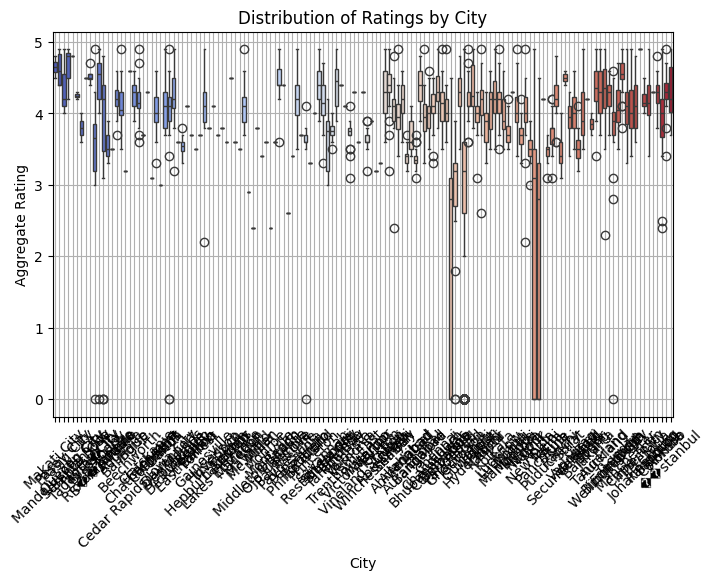

In [3]:
plt.figure(figsize=(8, 5))
sns.boxplot(x="City", y="Aggregate rating", data=data, palette="coolwarm")
plt.title("Distribution of Ratings by City")
plt.xticks(rotation=45)
plt.xlabel("City")
plt.ylabel("Aggregate Rating")
plt.grid(True)
plt.show()

## Visualizing Restaurant Locations on a Map (ADDITIONAL TASK)

We'll use Folium to create an interactive map displaying restaurant locations.


In [4]:
m = folium.Map(location=[data["Latitude"].mean(), data["Longitude"].mean()], zoom_start=14)
marker_cluster = MarkerCluster().add_to(m)

for idx, row in data.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"{row['Restaurant Name']} - Rating: {row['Aggregate rating']}",
    ).add_to(marker_cluster)

m.save("restaurant_map_task_4.html")

m